In [1]:
import os
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import scanpy as sc
import squidpy as sq
from muon import atac as ac
import pandas as pd

In [2]:
peak_dir = '../../results/09_spatial_atac/01_get_peaks'
data_dir = '../../SpatialATAC/ProcessedData/AnnData/Enric_NBT_2023'
out_dir = '../../results/09_spatial_atac/03_clustering_svps'

In [3]:
os.makedirs(out_dir, exist_ok=True)

In [4]:
dataset_list = ['E12_5_rep1', 'E13_5_rep2', 'E15_5_rep1']

In [5]:
method_list = ['nnSVG', 'Spanve', 'SPARK-X', 'SpatialDE', 
               'SOMDE', 'MoranI', 'scGCO', 'SpaGCN', 'SpaGFT', 
               'Sepal', 'SpatialDE2']

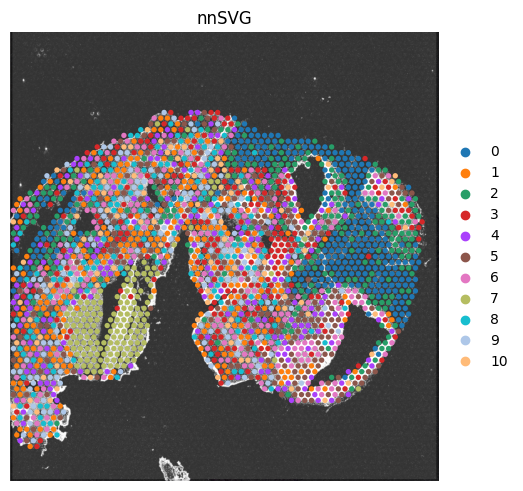

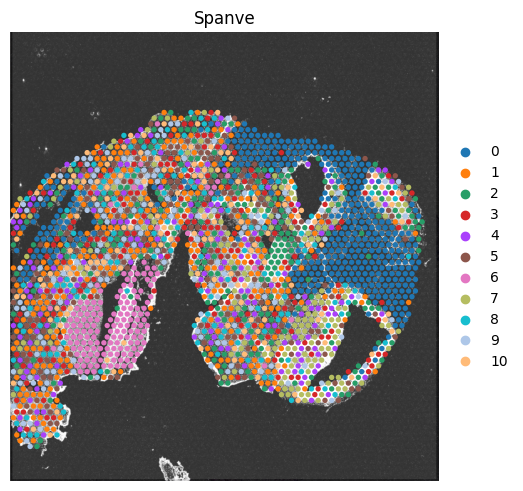

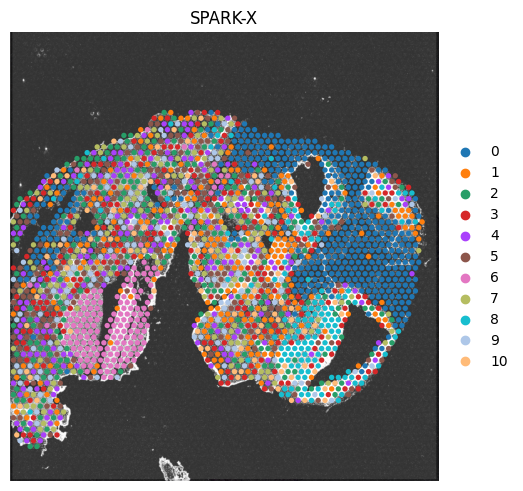

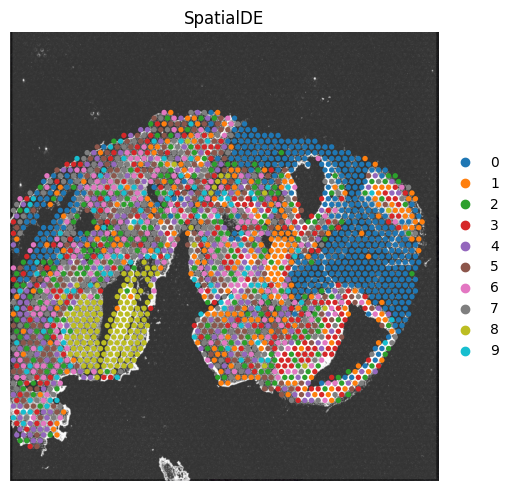

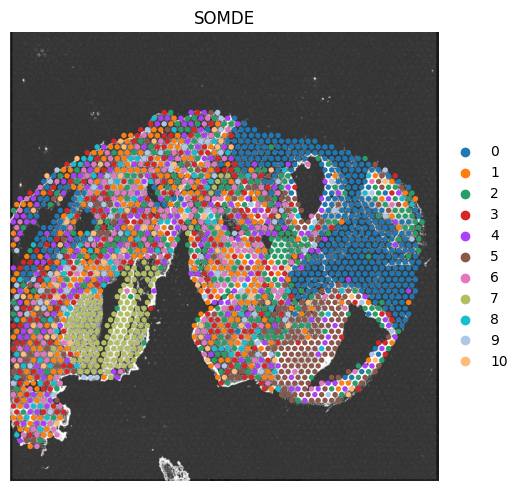

...

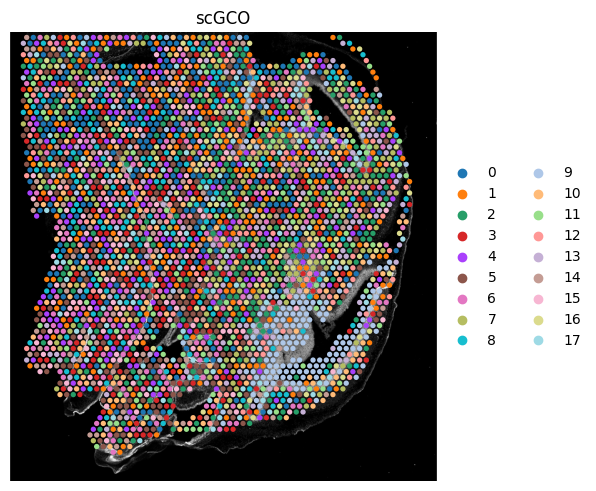

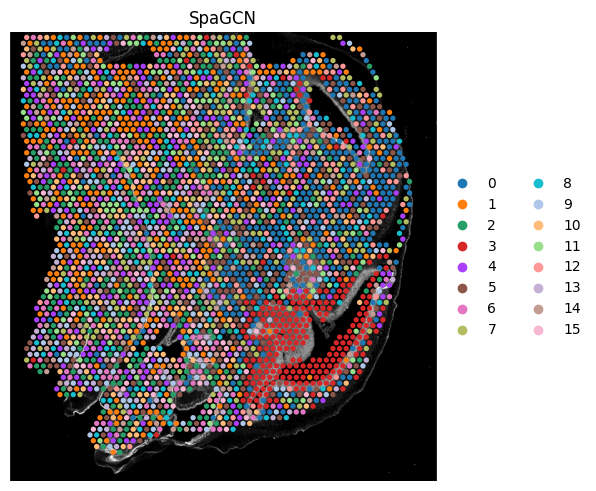

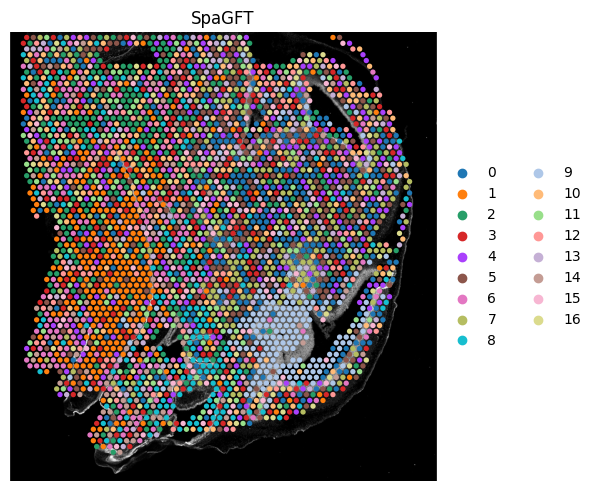

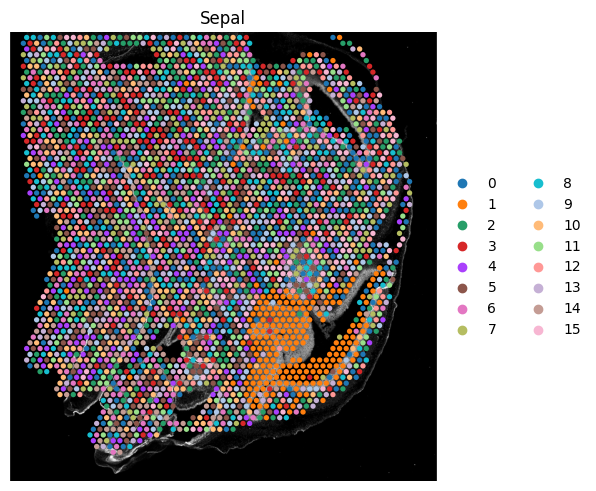

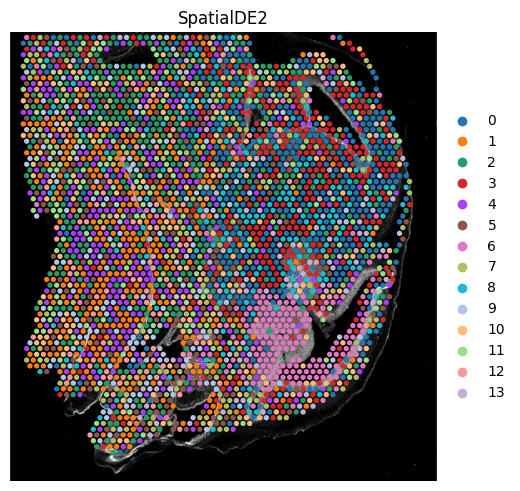

In [6]:
for dataset in dataset_list:
    os.makedirs(f'{out_dir}/{dataset}', exist_ok=True)
    
    for method in method_list:
        input_file = f'{peak_dir}/{method}/{dataset}.csv'
        
        if os.path.exists(input_file):
            df = pd.read_csv(input_file)
            
            adata = sc.read_h5ad(f"{data_dir}/{dataset}.h5ad")
            adata = adata[:, df['peak']].copy()
        
            adata.X = adata.layers['counts'].copy()
            
            ac.preproc.tfidf(adata)
            ac.tools.lsi(adata)
            sc.pp.neighbors(adata, use_rep="X_lsi", n_pcs=30)
            sc.tl.umap(adata)
            sc.tl.leiden(adata)
    
            adata.write_h5ad(f'./{out_dir}/{dataset}/{method}.h5ad')
            adata.obs.to_csv(f'./{out_dir}/{dataset}/{method}.csv')
            sq.pl.spatial_scatter(adata, color='leiden', frameon=False, 
                                  title=method, img_res_key='lowres', size=20)